In [1]:
import signalsnap as snp
import numpy as np
from scipy.fft import rfft, irfft, rfftfreq

In [2]:
t = np.linspace(0,0.02,int(100e4))
dt = t[1] - t[0]
f_max = 1/(dt)/2
print('f_Nyquist =', f_max / 1e6, 'MHz')

white_noise_1 = np.random.normal(size=len(t))

white_noise_2 = np.random.normal(size=len(t))

freq = rfftfreq(len(t), t[1]-t[0])
f_c = 0.2e6 # Hz
f_1 = 0.4e7
P_1 = 1
filter_func_1 = P_1/(np.pi * f_c) / (1 + ((freq-f_1)/f_c)**2)

f_c = 0.2e6 # Hz
f_2 = 0.6e7
P_2 = 1
filter_func_2 = P_2/(np.pi * f_c) / (1 + ((freq-f_2)/f_c)**2)

filtered_noise = (irfft(np.sqrt(filter_func_1) * rfft(white_noise_1))+ 0.0001)
filtered_noise *= (irfft(np.sqrt(filter_func_2) * rfft(white_noise_2))+0.0001)

f_Nyquist = 24.999975 MHz


Actual T_window: 1.000001000001e-05
Maximum frequency: 24999975.0
Number of points: 251


/Users/markus/opt/anaconda3/lib/python3.7/site-packages/signalsnap/analysis.py:1107: RuntimeWarning: invalid value encountered in multiply
  self.S_errs[3] = to_gpu(1j * np.empty((f_max_ind // 2, f_max_ind // 2, m_var)))


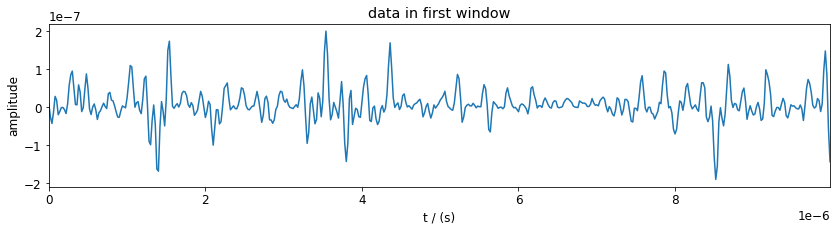

chunk shape:  500


In [3]:
spec = snp.Spectrum(delta_t=dt, data=filtered_noise)
T_window = 0.00001
f, s, serr = spec.calc_spec([2,3,4], f_max=f_max, T_window=T_window, m=5, backend='opencl')

In [4]:
spec.plot_interactive(2)

$S^{(2)}_z$ (Hz$^{-1}$)


In [10]:
spec.plot_interactive(4, sigma=5)

1


2


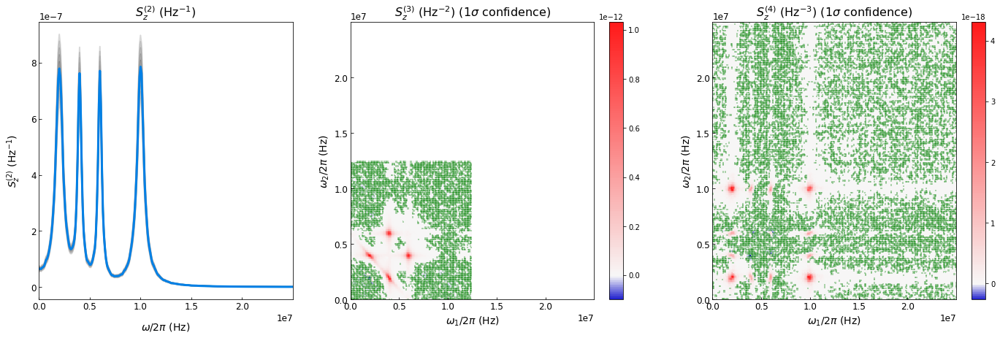

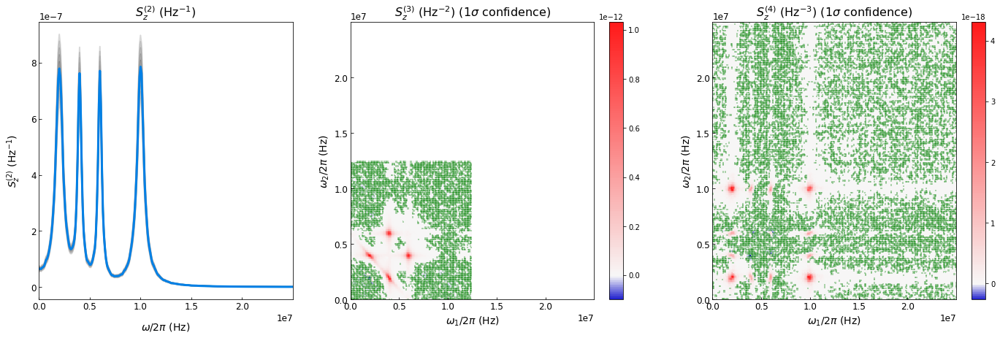

In [8]:
spec.plot()